In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import scprep
from tqdm import tqdm
import os
import sys

sys.path.append('../src')
from models.unified_model import GeometricAE
from models.distance_matching import DistanceMatching
from data_script import hemisphere_data, sklearn_swiss_roll
import tensorboard

/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Data
gt_X, X, _ = hemisphere_data(n_samples=1000, noise=0)
#gt_X, X, colors = sklearn_swiss_roll(n_samples=2000, noise=0.0)

print(gt_X.shape, X.shape)

(1000, 3) (1000, 3)


In [3]:
# Fit Affinity Matching Model
model_hypers = {
        'ambient_dimension': 3,
        'latent_dimension': 3,
        'model_type': 'distance',
        'activation': 'relu',
        'layer_widths': [256, 128, 64],
        'knn': 5,
        't': 'auto',
        'n_landmark': 5000,
        'verbose': False
}
training_hypers = {
    'data_name': 'randomtest',
    'mode': 'end2end', # 'encoder', 'decoder', 'end2end', 'separate
    'max_epochs': 2000,
    'batch_size': 64,
    'lr': 1e-3,
    'shuffle': True,
    'componentwise_std': False,
    'weight_decay': 1e-5,
    'dist_mse_decay': 1e-5,
    'monitor': 'validation/loss',
    'patience': 100,
    'seed': 2024,
    'log_every_n_steps': 100,
    'accelerator': 'auto',
    'train_from_scratch': True, # ?load pre-trained model
    'model_save_path': './distance_matching/model'
}

model = DistanceMatching(**model_hypers)
model.fit(X, train_mask=None, percent_test=0.2, **training_hypers)

Calculating PHATE...
  Running PHATE on 1000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.02 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.27 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.09 seconds.
  Calculating metric MDS...


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


  Calculated metric MDS in 1.38 seconds.
Calculated PHATE in 1.77 seconds.


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'preprocessor' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['preprocessor'])`.
  rank_zero_warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Fitting model ... {'dimensions': {'data': 3, 'latent': 3}, 'encoder': {'layer_widths': [256, 128, 64], 'activation': 'relu', 'batch_norm': False, 'dropout': 0.0}, 'decoder': {'layer_widths': [64, 128, 256], 'activation': 'relu', 'batch_norm': False, 'dropout': 0.0}, 'loss': {'dist_mse_decay': 1e-05, 'weights': {'dist': 0.9, 'reconstr': 0.1, 'cycle': 0.0, 'cycle_dist': 0.0}}, 'training': {'mode': 'end2end', 'max_epochs': 2000, 'accelerator': 'auto', 'lr': 0.001, 'weight_decay': 1e-05, 'dist_mse_decay': 1e-05, 'monitor': 'validation/loss', 'patience': 100, 'log_every_n_steps': 100}, 'logger': {'use_wandb': False}, 'path': {'root': './distance_matching', 'model': 'model', 'log': 'mylogs'}}


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /Users/danqiliao/Desktop/dmae/notebooks/distance_matching exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name    | Type    | Params
------------------------------------
0 | encoder | Encoder | 42.4 K
1 | decoder | Decoder | 42.4 K
------------------------------------
84.7 K    Trainable params
0         Non-trainable params
84.7 K    Total params
0.339     Total estimated model params size (MB)


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:488: PossibleUserWarning: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test/predict dataloaders.
  rank_zero_warn(
/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/utilities/data.py:84: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 64. To avoid any miscalculations, use `self.lo

Epoch 232: 100%|██████████| 800/800 [00:09<00:00, 81.23it/s, loss=0.154, v_num=2, train/dist_loss_step=0.176, train/reconstr_loss_step=0.00113, train/loss_step=0.159, validation/dist_loss=0.179, validation/reconstr_loss=0.0013, validation/loss=0.161, train/dist_loss_epoch=0.171, train/reconstr_loss_epoch=0.00124, train/loss_epoch=0.154]   
Done fitting model.


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'preprocessor' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['preprocessor'])`.
  rank_zero_warn(


In [4]:
Z = model.encode(torch.Tensor(X))
print('Encoded Z:', Z.shape)
X_hat = model.decode(Z)
print('Decoded X:', X_hat.shape)

Encoded Z: torch.Size([1000, 3])
Decoded X: torch.Size([1000, 3])


<Axes: title={'center': 'Latent'}>

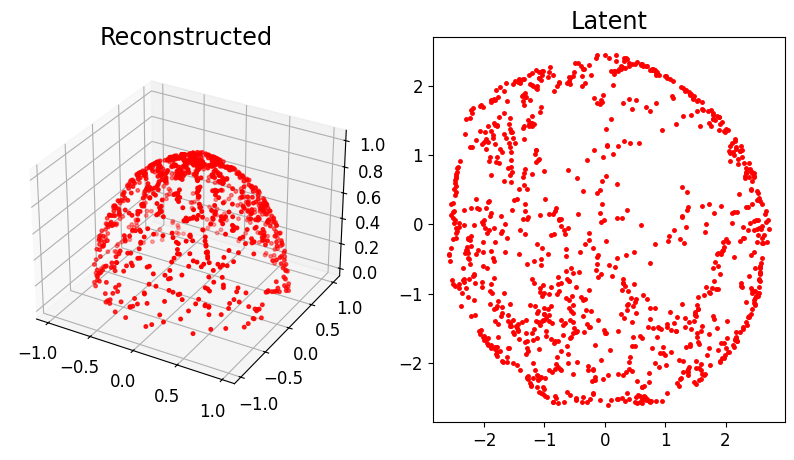

In [5]:
# Visualize
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(121, projection='3d')
scprep.plot.scatter3d(X_hat.detach().numpy(), c='r', title='Reconstructed', ax=ax)
ax = fig.add_subplot(122)
scprep.plot.scatter2d(Z.detach().numpy(), c='r', title='Latent', ax=ax)

In [6]:
metric = model.encoder_pullback(torch.Tensor(X))
print('Encoder Pullback:', metric.shape)

Encoder Pullback: torch.Size([1000, 3, 3])


In [7]:
class CurveNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, x0, x1, variance = 0.15 ):
        super().__init__()
        self.mod = nn.Sequential(nn.Linear(1,hidden_dim),
                    nn.Tanh(),
                    nn.Linear(hidden_dim,hidden_dim),
                    nn.Tanh(),
                    nn.Linear(hidden_dim,hidden_dim),
                    nn.Tanh(),
                    nn.Linear(hidden_dim,input_dim + 1))
        self.x0 = x0
        self.x1 = x1
        self.variance = variance
        self.input_dim = input_dim
    def forward(self, t):
    
        mu = t * self.x1 + (1-t) * self.x0
        
        enveloppe = self.variance * (1- (t*2-1)**2) * self.mod(t)[:, self.input_dim].reshape(-1, 1)
        outs =  self.mod(t)[:,:self.input_dim] * enveloppe + mu

        return outs

# randomly pick a pair of points
batch_x0 = torch.Tensor(X[np.random.choice(X.shape[0], 1)])
batch_x1 = torch.Tensor(X[np.random.choice(X.shape[0], 1)])

print('Batch X0:', batch_x0.shape)
print('Batch X1:', batch_x1.shape)

curve = CurveNet(input_dim=X.shape[1], hidden_dim=32, x0=batch_x0, x1=batch_x1, variance=0.15)
optimizer = torch.optim.Adam(curve.parameters(), lr=0.001)

Batch X0: torch.Size([1, 3])
Batch X1: torch.Size([1, 3])


tensor([[-0.0129,  0.0311,  0.9994]])
tensor([[-0.6082,  0.3031,  0.7336]])


/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/scprep/utils.py:238: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  x = np.array(x_out, dtype=_check_numpy_dtype(x_out))
/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/scprep/utils.py:238: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To re

<Axes3D: title={'center': 'Training Data'}>

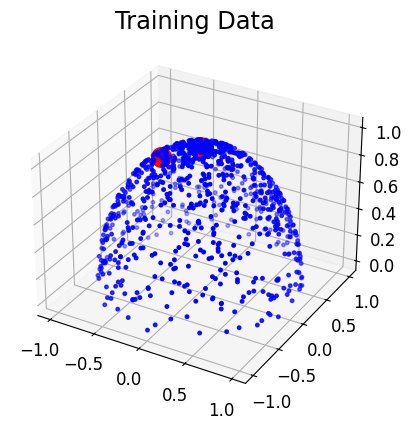

In [8]:
print(batch_x0)
print(batch_x1)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scprep.plot.scatter3d(X, c='b', title='Training Data', ax=ax)
scprep.plot.scatter3d(batch_x0, c='r', ax=ax)
scprep.plot.scatter3d(batch_x1, c='r', ax=ax)


In [9]:
def density_loss(outs, data, topk=5):
    '''
    Args:
        outs: shape (T, D)
        data: shape (N, D)
    Returns:
        l_density: shape (T,)
    '''
    if isinstance(data, np.ndarray):
        data = torch.Tensor(data)

    # pairwise distances
    dist = torch.cdist(outs, data) # [T, N]
    # closest topk distances
    topk_dist, _ = torch.topk(dist, topk, dim=1,largest=False) # [T, k]
    avg_topk = torch.mean(topk_dist, dim=1)

    l_density = avg_topk

    return l_density
    



t = torch.linspace(0, 1, 100).view(-1,1)
losses = []
density_lambda = 1.0
for _ in tqdm(range(500)):

    optimizer.zero_grad()

    #jac = torch.autograd.functional.jacobian(curve.forward, t, create_graph=True)
    jac = torch.autograd.functional.jacobian(curve.forward, t, create_graph=True)
    #print('jac: ', jac.shape)
    #print('jac = torch.einsum("tntd->tnd",jac)', torch.einsum("tntd->tnd",jac).shape)
    jac = torch.einsum("tntd->tnd",jac)[...,0]
    #print('jac.shape', jac.shape)

    out = curve(t)
        
    #m = metric(out)
    out_ = torch.Tensor(out.cpu().detach().numpy())
    m = model.encoder_pullback(out_)

    pre_prod = torch.einsum('tb,tbj->tj',jac,m)
    prod = torch.einsum('tb,tb->t', pre_prod, jac)

    # density loss
    l_density = density_loss(out, X).mean()
    ratio = np.floor(prod.mean().item() / l_density.item()) * 0.5

    #print('density_loss: ', l_density.item(), 'length loss: ', prod.mean().item())


    loss = prod.mean() +  l_density * ratio 
    loss.backward()
    optimizer.step()
    losses.append(loss.detach().numpy())

100%|██████████| 500/500 [04:06<00:00,  2.03it/s]


In [10]:
# Visualize
t = torch.linspace(0, 1, 1000).view(-1,1)
pred_geodesic = curve(t).detach().numpy()
print('Pred Geodesic:', pred_geodesic.shape)

Pred Geodesic: (1000, 3)


In [11]:
# Visualize pred geodesic on the ambient space
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scprep.plot.scatter3d(X, c='gray', title='Reconstructed', ax=ax, alpha=0.5)
# start and end points
scprep.plot.rotate_scatter3d(batch_x0, c='g', ax=ax)
scprep.plot.rotate_scatter3d(batch_x1, c='r', ax=ax)
scprep.plot.rotate_scatter3d(pred_geodesic, c='b', title='Pred Geodesic', ax=ax)

/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/scprep/utils.py:238: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  x = np.array(x_out, dtype=_check_numpy_dtype(x_out))
/Users/danqiliao/opt/miniconda3/envs/yale529/lib/python3.9/site-packages/scprep/utils.py:238: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To re